# Representing Signals in the Time and Frequency Domain

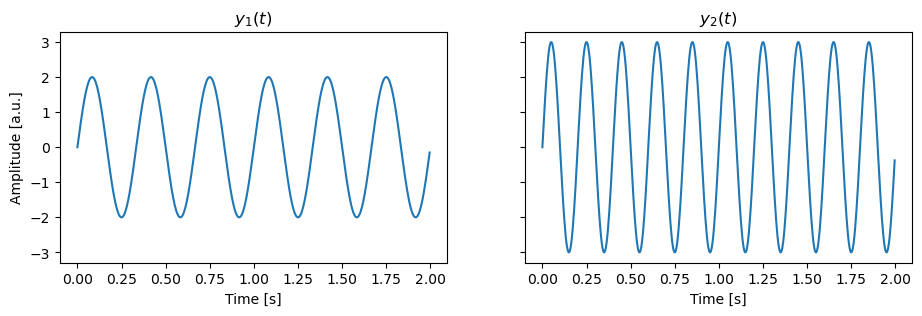

In [75]:
import numpy as np
from matplotlib import pyplot as plt
from scipy import signal as sig

fs = 250
dur=2
t = np.linspace(0, dur, fs*dur, endpoint=False)
y1 = 2 * np.sin(2* np.pi * 3 * t)
y2 = 3 * np.sin(2* np.pi * 5 * t)

fig, ax = plt.subplots(1, 2, figsize=(11, 3), sharex=True, sharey=True)
ax[0].plot(t, y1)
ax[1].plot(t, y2)
ax[0].set(xlabel="Time [s]", ylabel="Amplitude [a.u.]", title="$y_1(t)$")
ax[1].set(xlabel="Time [s]", title="$y_2(t)$");

Consider two sine waves of different <span style="color: green">frequency</span> and <span style="color: blue">amplitude</span>:


$y_1(t) = {\color{blue} 2} \sin(2\pi \cdot {\color{green} 3} \cdot t)$

$y_2(t) = {\color{blue} 5} \sin(2\pi \cdot {\color{green} 3} \cdot t)$

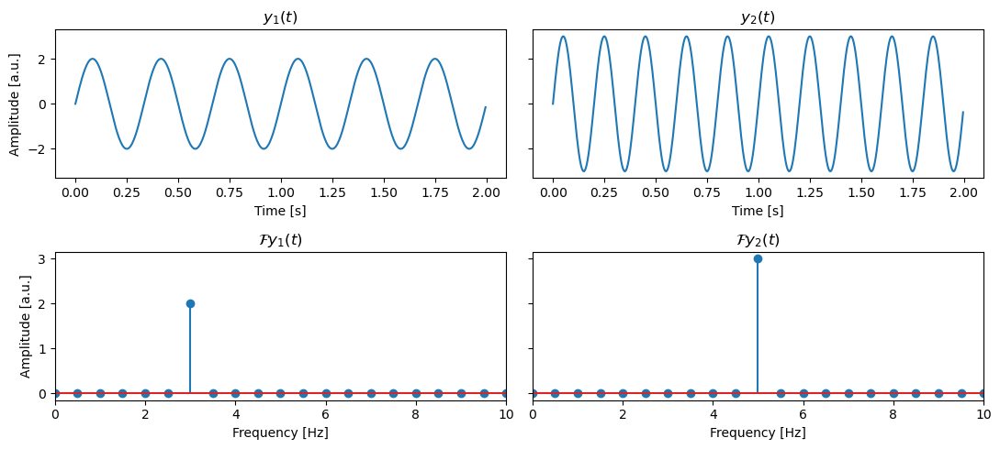

In [76]:
freq = np.fft.fftfreq(len(t), 1/fs)[:len(t)//2]
fft_y1 = np.abs(np.fft.fft(y1))[:len(t)//2] * 2/len(t)  # amplitude spectrum
fft_y2 = np.abs(np.fft.fft(y2))[:len(t)//2] * 2/len(t)

fig, ax = plt.subplots(2, 2, sharex="row", sharey="row", figsize=(11, 5))
ax[0, 0].plot(t, y1)
ax[0, 1].plot(t, y2)
ax[0, 0].set(xlabel="Time [s]", ylabel="Amplitude [a.u.]", title="$y_1(t)$")
ax[0, 1].set(xlabel="Time [s]", title="$y_2(t)$");
ax[1, 0].stem(freq, fft_y1)
ax[1, 1].stem(freq, fft_y2)
ax[1, 0].set(xlim=(0,10), xlabel="Frequency [Hz]", ylabel="Amplitude [a.u.]", title="$\mathcal{F}{y_1(t)}$")
ax[1, 1].set(xlim=(0,10), xlabel="Frequency [Hz]", title="$\mathcal{F}{y_2(t)}$")
plt.tight_layout();

The **Fourier transform** allows us to represent and visualize these signals in the **frequency domain**.

In a frequency spectrum, the x-axis represents frequency and the y-axis amplitude, i.e. how strongly a given frequency is represented in the signal.

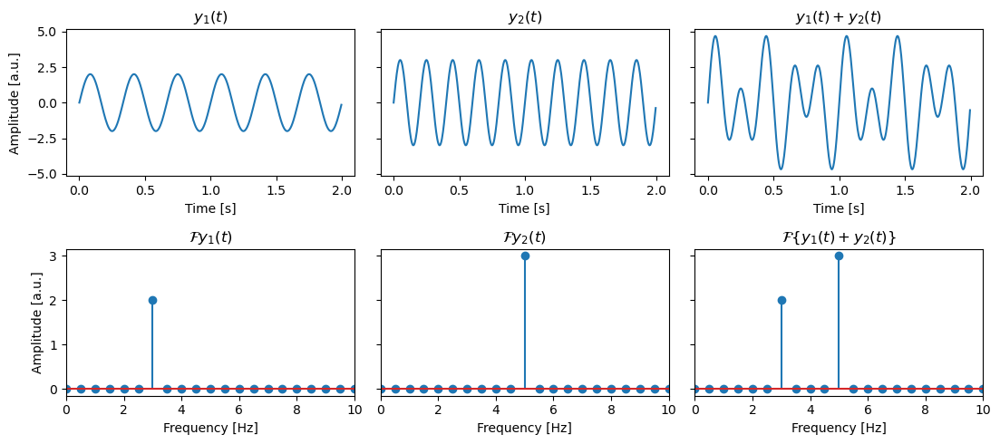

In [77]:
fft_y1y2 = np.abs(np.fft.fft(y1+y2))[:len(t)//2] * 2/len(t)  # amplitude spectrum

fig, ax = plt.subplots(2, 3, sharex="row", sharey="row", figsize=(11, 5))
ax[0, 0].plot(t, y1)
ax[0, 1].plot(t, y2)
ax[0, 2].plot(t, y1+y2)
ax[0, 0].set(xlabel="Time [s]", ylabel="Amplitude [a.u.]", title="$y_1(t)$")
ax[0, 1].set(xlabel="Time [s]", title="$y_2(t)$");
ax[0, 2].set(xlabel="Time [s]", title="$y_1(t)+y_2(t)$");
ax[1, 0].stem(freq, fft_y1)
ax[1, 1].stem(freq, fft_y2)
ax[1, 2].stem(freq, fft_y1y2)
ax[1, 0].set(xlim=(0,10), xlabel="Frequency [Hz]", ylabel="Amplitude [a.u.]", title="$\mathcal{F}{y_1(t)}$")
ax[1, 1].set(xlim=(0,10), xlabel="Frequency [Hz]", title="$\mathcal{F}{y_2(t)}$")
ax[1, 2].set(xlim=(0,10), xlabel="Frequency [Hz]", title="$\mathcal{F}\{y_1(t) + y_2(t)\}$")
plt.tight_layout()

Adding two signals in the time domain also adds their frequency spectra.

It can be **easier to characterize** a signal in the frequency domain.

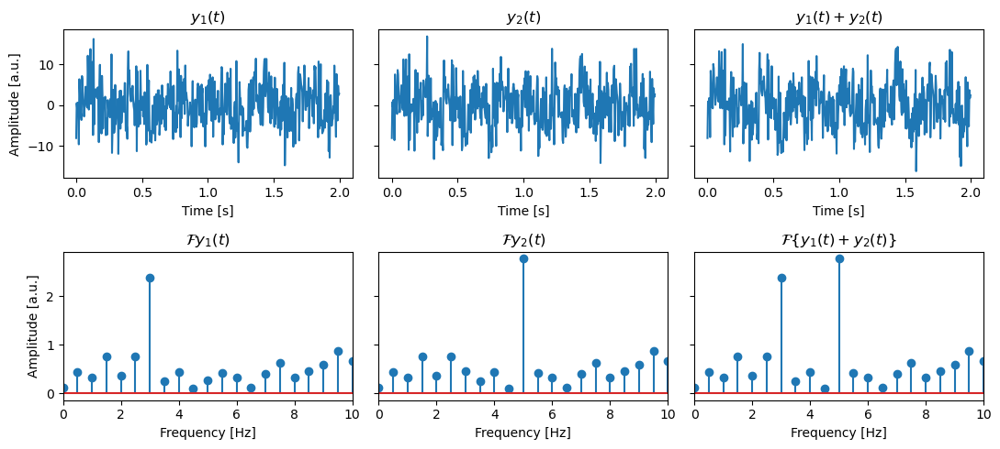

In [78]:
noise = np.random.randn(len(t))*5

fft_y1 = np.abs(np.fft.fft(y1+noise))[:len(t)//2] * 2/len(t)  # amplitude spectrum
fft_y2 = np.abs(np.fft.fft(y2+noise))[:len(t)//2] * 2/len(t)
fft_y1y2 = np.abs(np.fft.fft(y1+y2+noise))[:len(t)//2] * 2/len(t)  # amplitude spectrum

fig, ax = plt.subplots(2, 3, sharex="row", sharey="row", figsize=(11, 5))
ax[0, 0].plot(t, y1+noise)
ax[0, 1].plot(t, y2+noise)
ax[0, 2].plot(t, y1+y2+noise)
ax[0, 0].set(xlabel="Time [s]", ylabel="Amplitude [a.u.]", title="$y_1(t)$")
ax[0, 1].set(xlabel="Time [s]", title="$y_2(t)$");
ax[0, 2].set(xlabel="Time [s]", title="$y_1(t)+y_2(t)$")
ax[1, 0].stem(freq, fft_y1)
ax[1, 1].stem(freq, fft_y2)
ax[1, 2].stem(freq, fft_y1y2)
ax[1, 0].set(xlim=(0,10), xlabel="Frequency [Hz]", ylabel="Amplitude [a.u.]", title="$\mathcal{F}{y_1(t)}$")
ax[1, 1].set(xlim=(0,10), xlabel="Frequency [Hz]", title="$\mathcal{F}{y_2(t)}$")
ax[1, 2].set(xlim=(0,10), xlabel="Frequency [Hz]", title="$\mathcal{F}\{y_1(t) + y_2(t)\}$")
plt.tight_layout()

The frequency domain representation of a signal also is less sensitive to (white) noise.

# A Brief Introduction to the Fourier Transform

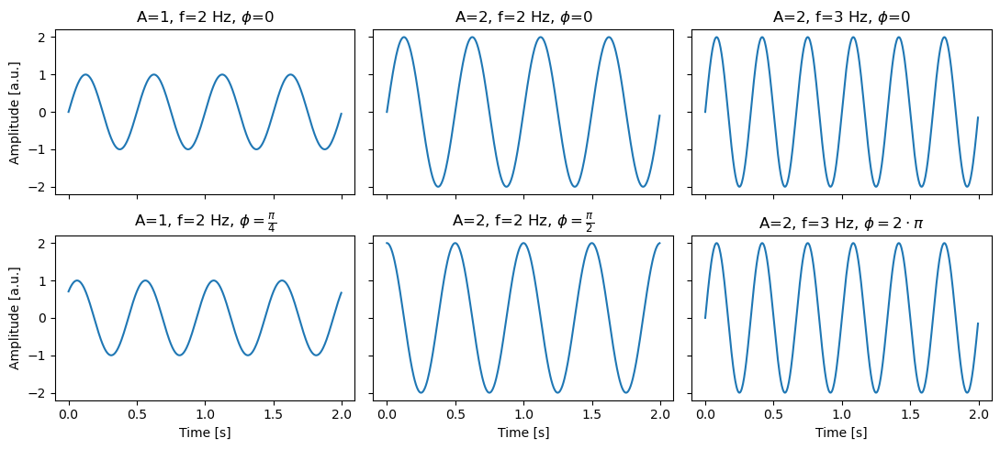

In [79]:
t = np.linspace(0, 2, 500, endpoint=False)

fig, ax = plt.subplots(2, 3, figsize=(11, 5), sharex=True, sharey=True)

ax[0, 0].plot(t, 1 * np.sin(2 * np.pi * 2 * t))
ax[0, 0].set(title='A=1, f=2 Hz, $\phi$=0')

ax[0, 1].plot(t, 2 * np.sin(2 * np.pi * 2 * t))
ax[0, 1].set(title='A=2, f=2 Hz, $\phi$=0')

ax[0, 2].plot(t, 2 * np.sin(2 * np.pi * 3 * t))
ax[0, 2].set(title='A=2, f=3 Hz, $\phi$=0')

ax[1, 0].plot(t, 1 * np.sin(2 * np.pi * 2 * t + np.pi/4))
ax[1, 0].set(title='A=1, f=2 Hz, $\phi=\\frac{\pi}{4}$')

ax[1, 1].plot(t, 2 * np.sin(2 * np.pi * 2 * t + np.pi/2))
ax[1, 1].set(title='A=2, f=2 Hz, $\phi=\\frac{\pi}{2}$')

ax[1, 2].plot(t, 2 * np.sin(2 * np.pi * 3 * t + 2*np.pi))
ax[1, 2].set(title='A=2, f=3 Hz, $\phi=2 \cdot \pi$')

ax[0, 0].set(ylabel='Amplitude [a.u.]')
ax[1, 0].set(ylabel='Amplitude [a.u.]', xlabel='Time [s]')
ax[1, 1].set(xlabel='Time [s]')
ax[1, 2].set(xlabel='Time [s]')

plt.tight_layout();


The Fourier transform decomposes the signal into a series of sine waves:

$$y(t) = \sum_{k} {\color{blue} A_k} \sin(2\pi {\color{green} f_k} t + {\color{orange} \phi_k})$$

where ${\color{blue} A_k}$ is the <span style="color: blue">amplitude</span>,  ${\color{green} f_k}$ the <span style="color: green">frequency</span> and ${\color{orange} \phi_k}$ the <span style="color: orange">phase</span> of the $k_{th}$ sine wave




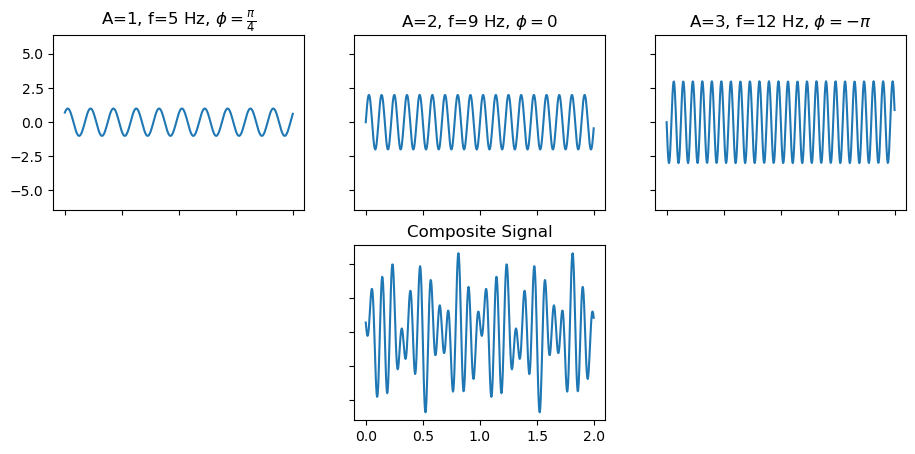

In [80]:

fig, ax = plt.subplots(2, 3, figsize=(11, 5), sharex=True, sharey=True)

s1 = 1 * np.sin(2 * np.pi * 5 * t + np.pi/4)
ax[0, 0].plot(t, s1)
ax[0, 0].set(title='A=1, f=5 Hz, $\phi=\\frac{\pi}{4}$')

s2 = 2 * np.sin(2 * np.pi * 9 * t)
ax[0, 1].plot(t, s2)
ax[0, 1].set(title='A=2, f=9 Hz, $\phi=0$')

s3 = 3 * np.sin(2 * np.pi * 12 * t + -np.pi)
ax[0, 2].plot(t, s3)
ax[0, 2].set(title='A=3, f=12 Hz, $\phi=-\pi$')


s = s1+s2+s3
ax[1,1].plot(t, s )
ax[1, 1].set(title='Composite Signal')

ax[1,0].axis("off")
ax[1,2].axis("off");


Let's consider a composite signal made up of three sinusoids with different frequency, amplitude and phase.

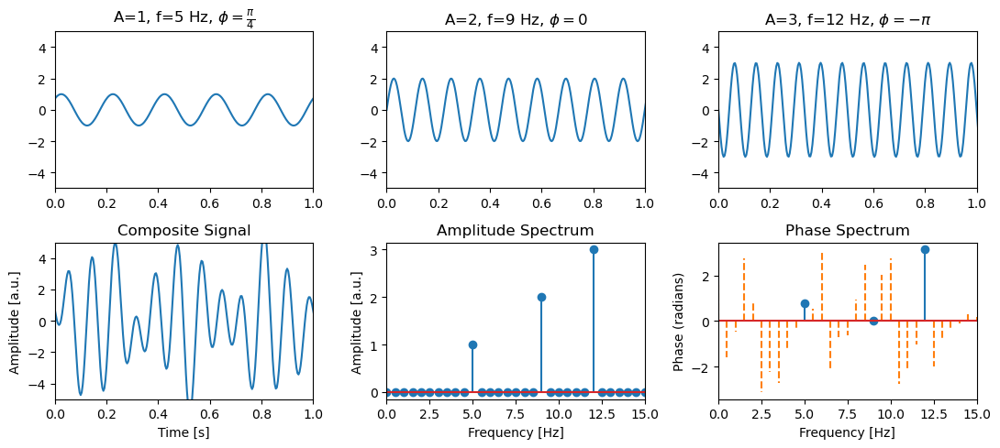

In [81]:
y = s
fft_y = np.fft.fft(y)[:len(t)//2]

amplitude = np.abs(fft_y) * 2/len(t)
phase = np.angle(fft_y) + np.pi/2  # convert cosine-relative to sine-relative
phase = (phase + np.pi) % (2 * np.pi) - np.pi  # wrap to [-π, π]

fig, ax = plt.subplots(2,3 , figsize=(11, 5))


ax[0, 0].plot(t, s1)
ax[0, 0].set(title='A=1, f=5 Hz, $\phi=\\frac{\pi}{4}$', ylim=(-5, 5), xlim=(0, 1))

s2 = 2 * np.sin(2 * np.pi * 9 * t)
ax[0, 1].plot(t, s2)
ax[0, 1].set(title='A=2, f=9 Hz, $\phi=0$', ylim=(-5, 5), xlim=(0, 1))

s3 = 3 * np.sin(2 * np.pi * 12 * t + -np.pi)
ax[0, 2].plot(t, s3)
ax[0, 2].set(title='A=3, f=12 Hz, $\phi=-\pi$', ylim=(-5, 5), xlim=(0, 1))

ax[1, 0].plot(t, y)
ax[1, 0].set(title='Composite Signal', xlabel="Time [s]", ylabel="Amplitude [a.u.]", ylim=(-5, 5), xlim=(0, 1))

ax[1, 1].stem(freq, amplitude)
ax[1, 1].set(title='Amplitude Spectrum',xlabel='Frequency [Hz]', ylabel="Amplitude [a.u.]", xlim=(0,15))

threshold = 0.1
significant = amplitude > threshold
ax[1, 2].stem(freq[significant], phase[significant])
ax[1, 2].stem(freq[~significant], phase[~significant], linefmt="C1--", markerfmt="none")
ax[1, 2].set(title='Phase Spectrum', xlabel='Frequency [Hz]', ylabel='Phase (radians)', xlim=(0, 15))
plt.tight_layout()


The **amplitude spectrum** represents the frequency content of the signal independently of time. The time information is stored in the **phase spectrum** of the signal.

While we get a phase for every frequency bin, the values are only valid if the amplitude of the signal at that frequency is not 0.

# Finite Impulse Response (FIR) Filters

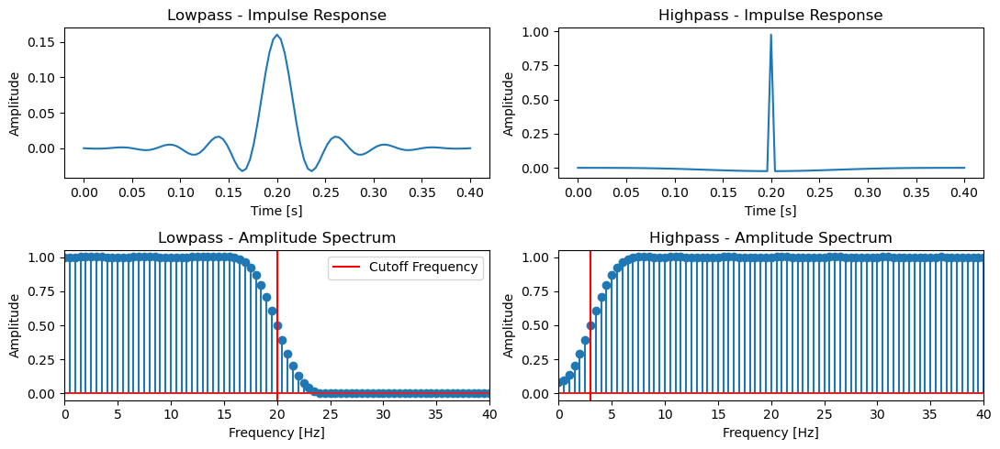

In [ ]:
fs = 250  # sampling rate
dur = 2
impulse = sig.unit_impulse(len(t))

numtaps = 101
cutoff_low = 20
b = sig.firwin(numtaps, cutoff_low, fs=fs, window='hamming')
filter_ir1 = sig.lfilter(b, [1.0], impulse)
fft_filter1 = np.abs(np.fft.fft(filter_ir1))[:len(t)//2]

numtaps = 101
cutoff_high = 3
b = sig.firwin(numtaps, cutoff_high, fs=fs, window='hamming', pass_zero=False)
filter_ir2 = sig.lfilter(b, [1.0], impulse)
fft_filter2 = np.abs(np.fft.fft(filter_ir2))[:len(t)//2]

fig, ax = plt.subplots(2, 2, figsize=(11, 5))

ax[0, 0].plot(t[:numtaps], filter_ir1[:numtaps])
ax[0, 0].set(xlabel='Time [s]', ylabel='Amplitude', title='Lowpass - Impulse Response')
ax[1, 0].stem(freq, fft_filter1)
ax[1, 0].set(xlabel='Frequency [Hz]', ylabel='Amplitude', xlim=(0, 40), title="Lowpass - Amplitude Spectrum")
ax[1, 0].axvline(cutoff_low, color="red", label="Cutoff Frequency")
ax[1, 0].legend()

ax[0, 1].plot(t[:numtaps], filter_ir2[:numtaps])
ax[0, 1].set(xlabel='Time [s]', ylabel='Amplitude', title='Highpass - Impulse Response')
ax[1, 1].stem(freq, fft_filter2)
ax[1, 1].set(xlabel='Frequency [Hz]', ylabel='Amplitude', xlim=(0, 40), title="Highpass - Frequency Response")
ax[1, 1].axvline(cutoff_high, color="red", label="Cutoff Frequency")

plt.tight_layout()

in the time domain, FIR filters are characterized in the time domain by their **impulse response** and in the frequency domain by their **amplitude spectrum**. Applying the filter to a signal will attenuate all frequencies where the amplituide of the filter's frequency response is lower than 1.

[(0.0, 40.0)]

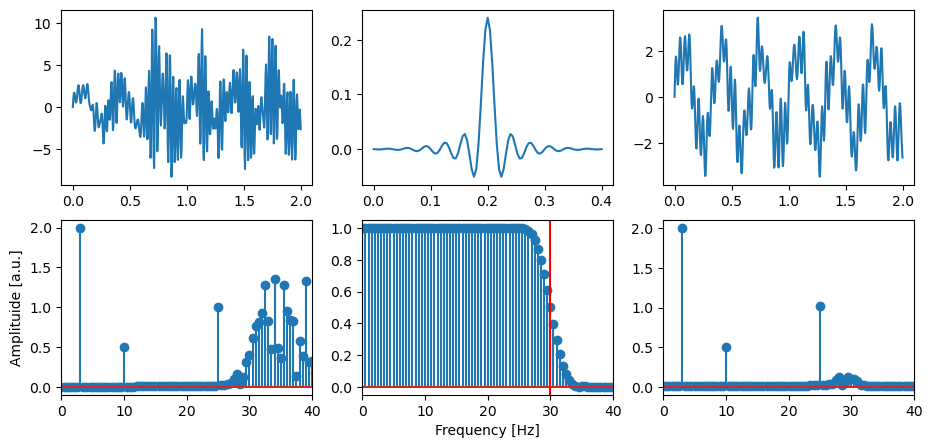

In [151]:
fs = 250
dur = 2
t = np.linspace(0, dur, fs * dur, endpoint=False)
freq = np.fft.fftfreq(len(t), 1/fs)[:len(t)//2]

s = (2 * np.sin(2 * np.pi * 3 * t) + 
     0.5 * np.sin(2 * np.pi * 10 * t) + 
     1 * np.sin(2 * np.pi * 25 * t))

rng = np.random.default_rng(42)
noise = rng.standard_normal(len(t)) * 10

b_noise = sig.firwin(101, [30, 40], fs=fs, pass_zero=False)
noise_30hz = sig.lfilter(b_noise, [1.0], noise)
s = s + noise_30hz

s_filt = sig.filtfilt(b, [1.0], s)

fft_s = np.fft.fft(s)[:len(t)//2]
amplitude_s = np.abs(fft_s) * 2/len(t)

fft_s_filt = np.fft.fft(s_filt)[:len(t)//2]
amplitude_s_filt = np.abs(fft_s_filt) * 2/len(t)

numtaps = 101
cutoff_low = 30
b = sig.firwin(numtaps, cutoff_low, fs=fs, window='hamming')
filter_ir = sig.lfilter(b, [1.0], impulse)
fft_filter = np.abs(np.fft.fft(filter_ir))[:len(t)//2]

fig, ax = plt.subplots(2, 3, figsize=(11, 5))
ax[0, 0].plot(t, s)
ax[0, 1].plot(t[:numtaps], filter_ir[:numtaps])
ax[0, 2].plot(t, s_filt)
ax[1, 0].stem(freq, amplitude_s)
ax[1, 1].stem(freq, fft_filter)
ax[1, 2].stem(freq, amplitude_s_filt)
ax[1, 1].axvline(cutoff_low, color="red")

ax[1, 0].set(xlim=(0, 40), ylabel="Amplituide [a.u.]")
ax[1, 1].set(xlim=(0, 40), xlabel="Frequency [Hz]")
ax[1, 2].set(xlim=(0, 40))

By Applying a filter, we can remove noise within a particular frequency range (e.g. powerline noise) to isolate the signal of interest. Note however that **any signal** within the rejected frequency range will be lost.

In [164]:
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Rectangle
from IPython.display import HTML

plt.rcParams['animation.embed_limit'] = 50  # MB

half = numtaps // 2
y_full = np.convolve(s, b, mode='same')
x_padded = np.pad(s, half, mode='constant')
scale = np.abs(s).max() / np.abs(b).max() * 0.4
max_prod = max(np.abs(x_padded[n: n + numtaps] * b).max() for n in range(len(t))) * 1.1

fig, axes = plt.subplots(3, 1, figsize=(10, 5), sharex=True)
fig.subplots_adjust(hspace=0.5)

# Panel 0: signal + sliding kernel
y_min, y_max = s.min() - 0.5, s.max() + 0.5
axes[0].plot(t, s, color='steelblue', linewidth=1.5, label='Signal')
kernel_line, = axes[0].plot([], [], color='tomato', linewidth=2, label='Filter kernel (scaled)')
highlight = Rectangle((0, y_min), 1/fs, y_max - y_min, alpha=0.15, color='orange')
axes[0].add_patch(highlight)
axes[0].set(xlim=(t[0], t[-1]), ylim=(y_min, y_max),
            ylabel='Amplitude [a.u.]', title='Signal and Filter Kernel')
axes[0].legend(loc='upper right', fontsize=9)

# Panel 1: element-wise product
axes[1].axhline(0, color='k', linewidth=0.5)
axes[1].set(xlim=(t[0], t[-1]), ylim=(-max_prod*0.7, max_prod*0.7),
            ylabel='Amplitude [a.u.]', title='Element-wise Product')
prod_fill = [axes[1].fill_between([], [])]

# Panel 2: filtered output being built up
axes[2].plot(t, y_full, color='lightgray', linestyle='--', linewidth=1.5, label='Final output')
output_line, = axes[2].plot([], [], color='seagreen', linewidth=2, label='Output so far')
output_dot, = axes[2].plot([], [], 'o', color='seagreen', markersize=6)
axes[2].set(xlim=(t[0], t[-1]), ylim=(y_full.min() - 0.3, y_full.max() + 0.3),
            ylabel='Amplitude [a.u.]', xlabel='Time [s]', title='Filtered Output')
axes[2].legend(loc='upper right', fontsize=9)

def animate(n):
    k_indices = np.arange(n - half, n + half + 1)
    k_times = k_indices / fs
    window = x_padded[n: n + numtaps]
    product = window * b
    mask = (k_times >= t[0]) & (k_times <= t[-1])

    kernel_line.set_data(k_times[mask], b[mask] * scale)
    t0, t1 = k_times[mask][[0, -1]]
    highlight.set_x(t0)
    highlight.set_width(t1 - t0)

    prod_fill[0].remove()
    prod_fill[0] = axes[1].fill_between(k_times[mask], product[mask], alpha=0.6, color='mediumpurple')

    output_line.set_data(t[:n + 1], y_full[:n + 1])
    output_dot.set_data([t[n]], [y_full[n]])

    return kernel_line, output_line, output_dot

anim = FuncAnimation(fig, animate, frames=range(0, len(t), 5), interval=50, blit=False)
plt.close()
HTML(anim.to_jshtml(default_mode='loop'))


A filter is applied via **convolution**: sliding the kernel across the signal and computing the **dot product**.